In [29]:
# import numpy as np
# import cv2
# from skimage import img_as_float64
# import matplotlib.pyplot as plt

# def singleScale(img,sigma):
#
#     # L = S * G
#     L = cv2.GaussianBlur(img,(0,0),sigma)

#     # L = cv2.GaussianBlur(img,(3,3),0)


#     # SSR = np.log10(img) - np.log10(cv2.GaussianBlur(img,(0,0),sigma))

#     SSR = np.log10(img) - np.log10(L)

#     return SSR , L

# def multiScale(img,sigmas : list):
#

#     # \omega is 1/3 and equal for all

#     retinex = np.zeros_like(img)
#     # luminance = np.zeros_like(img)
#     for s in sigmas:
#         SSR , L = singleScale(img, s)
#         retinex += SSR
#         # luminance += L

#     MSR = retinex/len(sigmas)
#     # luminance = luminance/len(sigmas)
#     return MSR

# def crf(img, alpha, beta):
#
#     img_sum = np.sum(img,axis=2,keepdims=True)


#     i_prime = img / img_sum

#     # color_restoration = beta * (np.log10(alpha*img) - np.log10(img_sum))

#     color_restoration = beta * (np.log10(alpha*i_prime))


#     return color_restoration



# def MSRCR(img, sigmas :list, alpha, beta, G, b):

#     # Dynamic = 2


#     # # Mean = np.mean(MSR)
#     # # Var = np.var(MSR)



#     # img = img_as_float64(img)+1

#     # MSR = multiScale(img, sigmas)
#     # # C = crf(img, alpha, beta)
#     # # MSRCR = G * (MSR*C + b)
#     # MSRCR = np.zeros_like(img)
#     # for i in range(MSR.shape[2]):
#     #   MSRCR[:, :, i] = 255 * (  (MSR[:, :, i] - np.mean(MSR[:, :, i]) + Dynamic*np.var(MSR[:, :, i]))  / (2*Dynamic*np.var(MSR[:, :, i]))   )

#     # MSRCR = np.uint8(np.minimum(np.maximum(MSRCR, 0), 255))



#     img = img_as_float64(img)+1

#     MSR = multiScale(img, sigmas)
#     img_color = crf(img, alpha, beta)
#     MSRCR = G * (MSR*img_color + b)


#     for i in range(MSRCR.shape[2]):
#         MSRCR[:, :, i] = (MSRCR[:, :, i] - np.min(MSRCR[:, :, i])) / \
#                                 (np.max(MSRCR[:, :, i]) - np.min(MSRCR[:, :, i])) * \
#                                 255

#     MSRCR = np.uint8(np.minimum(np.maximum(MSRCR, 0), 255))



#     return MSRCR

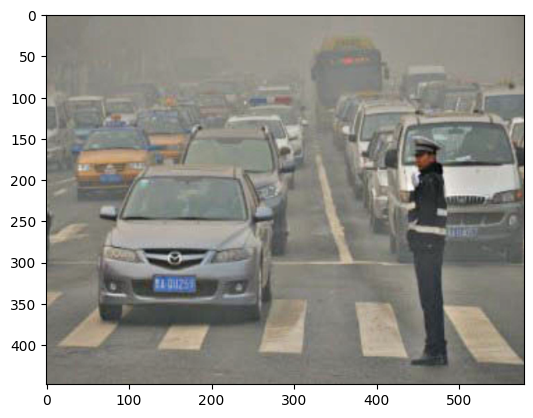

In [37]:
# SIGMA_LIST = [15, 80, 250]
# ALPHA = 125.0
# BETA = 46.0
# G = 5.0
# OFFSET = 25.0

# image = cv2.imread('../Capture.PNG')
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# MSRCR_img = MSRCR(image,SIGMA_LIST,ALPHA,BETA,G,OFFSET)
# plt.imshow(MSRCR_img)

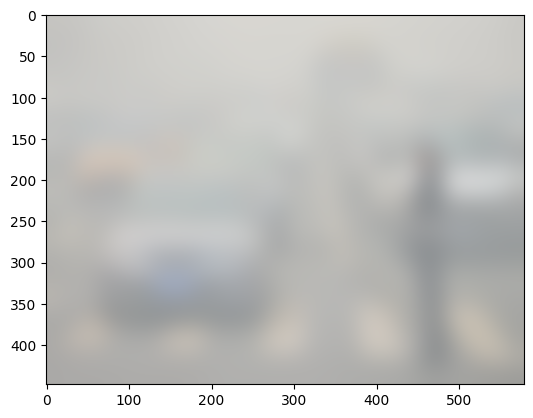

In [36]:
# image = cv2.imread('../Capture.PNG')
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# # msrcr_img = MSRCR(image,SIGMA_LIST,ALPHA,BETA,G,OFFSET)

# image = img_as_float64(image)

# img_msr , img_L = singleScale(image, 15)
# plt.imshow(img_L )

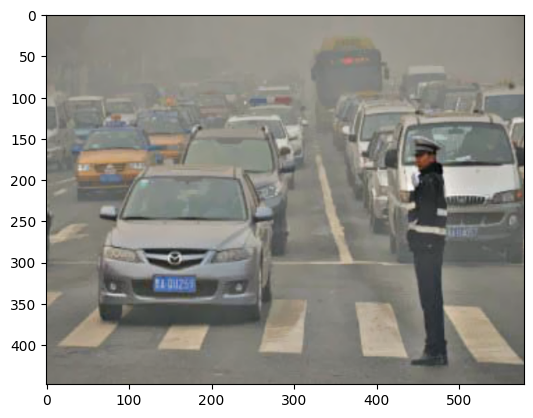

In [42]:
# def bilateral_filter(img, filter_radius=15, sigma_d=5, sigma_r=0.03):

#     sigma_color = sigma_r * 255  # Convert to the range of [0, 255]
#     sigma_space = sigma_d
#     return cv2.bilateralFilter(img, filter_radius, sigma_color, sigma_space)



# bilateral = bilateral_filter(MSRCR_img)
# # bilateral = cv2.bilateralFilter(MSRCR_img, 5, 0.03, 15)
# # bilateral = cv2.bilateralFilter(MSRCR_img, 15, 75, 75)
# plt.imshow(bilateral)

In [46]:
# def display_image_in_actual_size(img):

#     dpi = 80

#     height, width, depth = img.shape

#     # What size does the figure need to be in inches to fit the image?
#     figsize = width / float(dpi), height / float(dpi)

#     # Create a figure of the right size with one axes that takes up the full figure
#     fig = plt.figure(figsize=figsize)
#     ax = fig.add_axes([0, 0, 1, 1])

#     # Hide spines, ticks, etc.
#     ax.axis('off')

#     # Display the image.
#     ax.imshow(img, cmap='gray')

#     plt.show()



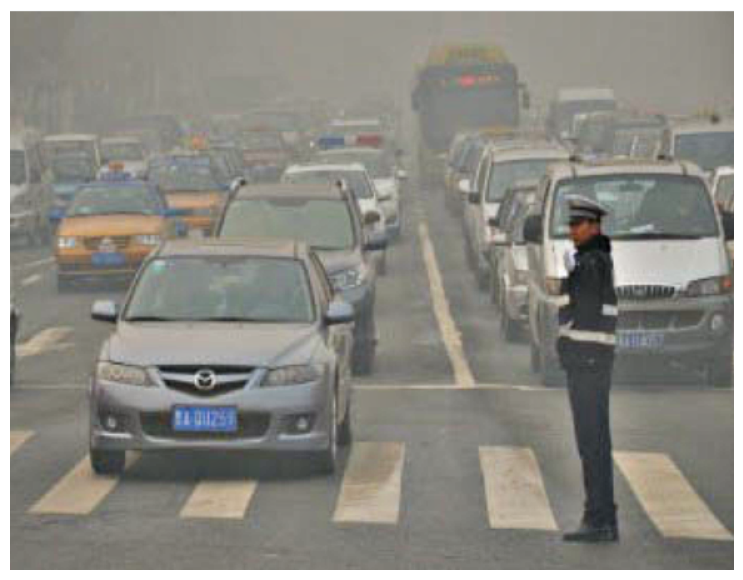

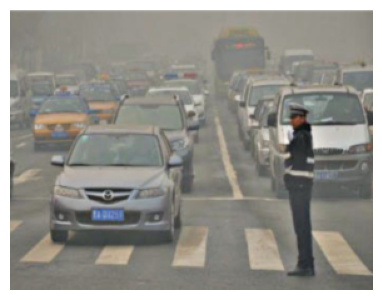

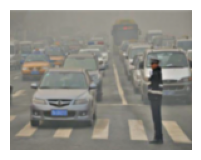

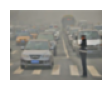

In [52]:
# gaussian = []

# gaussian_layer= MSRCR_img.copy()

# gaussian.append(gaussian_layer)
# display_image_in_actual_size(gaussian_layer)
# for i in range(3):
#     gaussian_layer = cv2.pyrDown(gaussian_layer)
#     gaussian.append(gaussian_layer)
#     display_image_in_actual_size(gaussian_layer)


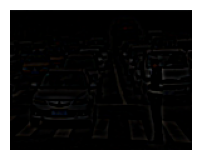

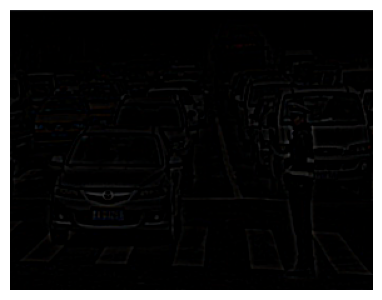

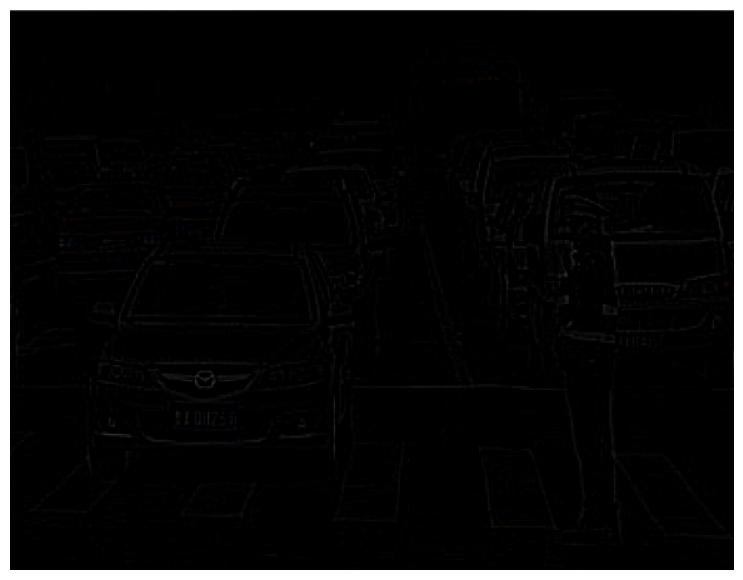

In [53]:
#  laplacian = [gaussian[-1]]
#  for i in range(3,0,-1):
#     size = (gaussian[i - 1].shape[1], gaussian[i - 1].shape[0])
#     gaussian_expanded = cv2.pyrUp(gaussian[i], dstsize=size)
#     laplacian_layer = cv2.subtract(gaussian[i-1], gaussian_expanded)
#     laplacian.append(laplacian_layer)
#     display_image_in_actual_size(laplacian_layer)

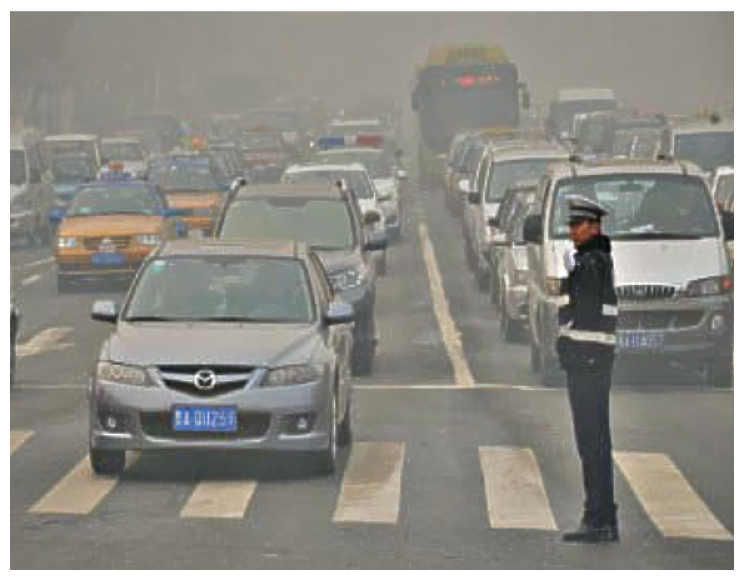

In [77]:
# Lambda = 1.2
# # img = img_as_float64(img)+1

# tmp =Lambda*img_as_float64(laplacian[-1])

# # LL = cv2.add(img_as_float64(bilateral),img_as_float64(tmp) )                    #bilateral +  #Lambda*laplacian[-1]

# # LL = cv2.addWeighted(img_as_float64(bilateral),0.7,img_as_float64(tmp),0.3,0)

# LL = img_as_float64(bilateral) + tmp
# display_image_in_actual_size(LL)

In [50]:
# bilateral.shape

(448, 579, 3)

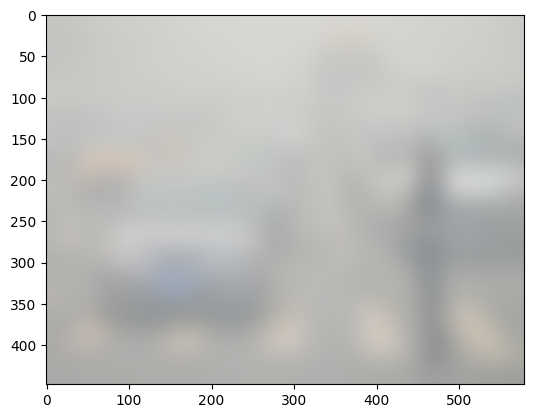

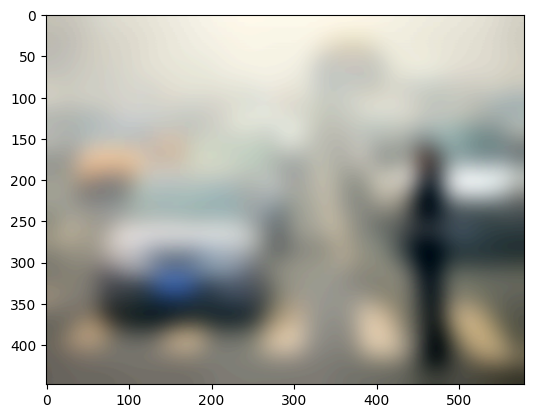

570823.1960784317

In [87]:
# img_msr , img_L = singleScale(image, 15)
# plt.imshow(img_L )
# plt.show()

# img_L = img_as_float64(img_L)
# sum = img_L.shape[0]*img_L.shape[1]*img_L.shape[2]
# N = 127

# # sum_of_values = 0
# # for m in range(img_L.shape[0]):
# #   for n in range(img_L.shape[1]):
# #     for p in range(img_L.shape[2]):
# #       sum_of_values += img_as_float64(img_L[m,n,p])


# sum_of_values = np.sum(img_L)

# gamma = sum_of_values / (sum * N)

# c = 1

# Ga = c * np.power(img_L, gamma)


# # Normalize the gamma corrected image to range [0, 1]
# Ga = (Ga - np.min(Ga)) / (np.max(Ga) - np.min(Ga))

# # Convert back to uint8 for display
# Ga = (Ga * 255).astype(np.uint8)

# plt.imshow(Ga )
# plt.show()
# sum_of_values

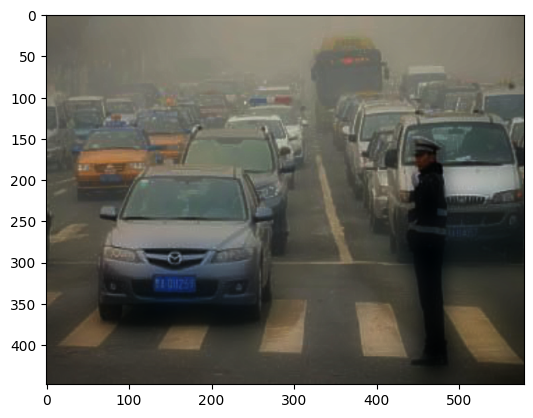

In [91]:
# S = img_as_float64(Ga) * img_as_float64(LL)

# # # Normalize the gamma corrected image to range [0, 1]
# # Ga = (Ga - np.min(Ga)) / (np.max(Ga) - np.min(Ga))

# # # Convert back to uint8 for display
# # Ga = (Ga * 255).astype(np.uint8)


# plt.imshow(S)

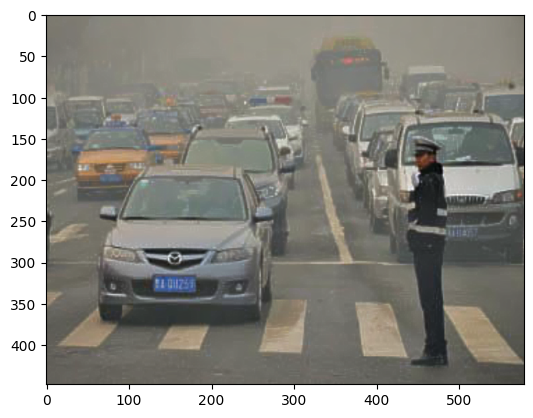

In [93]:
# alpha = 0.7

# result = cv2.addWeighted(img_as_float64(LL),alpha,img_as_float64(S),1-alpha,0)
# plt.imshow(result)

# Now let's make it modular!

In [1]:
import numpy as np
import cv2
from skimage import img_as_float64
import matplotlib.pyplot as plt

In [3]:
def display_image_in_actual_size(img):

    dpi = 80

    height, width, depth = img.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(img, cmap='gray')

    plt.show()



In [5]:
def singleScale(img,sigma):

    # L = S * G
    L = cv2.GaussianBlur(img,(0,0),sigma)

    # L = cv2.GaussianBlur(img,(3,3),0)


    # SSR = np.log10(img) - np.log10(cv2.GaussianBlur(img,(0,0),sigma))

    SSR = np.log10(img) - np.log10(L)

    return SSR , L

def multiScale(img,sigmas : list):

    # \omega is 1/3 and equal for all

    retinex = np.zeros_like(img)
    # luminance = np.zeros_like(img)
    for s in sigmas:
        SSR , L = singleScale(img, s)
        retinex += SSR
        # luminance += L

    MSR = retinex/len(sigmas)
    # luminance = luminance/len(sigmas)
    return MSR

def crf(img, alpha, beta):

    img_sum = np.sum(img,axis=2,keepdims=True)


    i_prime = img / img_sum

    # color_restoration = beta * (np.log10(alpha*img) - np.log10(img_sum))

    color_restoration = beta * (np.log10(alpha*i_prime))


    return color_restoration



def MSRCR(img, sigmas=[15, 80, 250], alpha=125.0, beta=46.0, G=5.0, b=25.0 ):
    """
    MSRCR (Multi-scale retinex with color restoration)

    Parameters :

    img : input image
    sigmas : list of all standard deviations in the X and Y directions, for Gaussian filter
    alpha : controls the strength of the nonlinearity
    beta : gain constant
    G : final gain
    b : offset
    """
    Dynamic = 2


    # Mean = np.mean(MSR)
    # Var = np.var(MSR)



    img = img_as_float64(img)+1

    MSR = multiScale(img, sigmas)
    # C = crf(img, alpha, beta)
    # MSRCR = G * (MSR*C + b)
    MSRCR = np.zeros_like(img)
    for i in range(MSR.shape[2]):
      MSRCR[:, :, i] = 255 * (  (MSR[:, :, i] - np.mean(MSR[:, :, i]) + Dynamic*np.var(MSR[:, :, i]))  / (2*Dynamic*np.var(MSR[:, :, i]))   )

    MSRCR = np.uint8(np.minimum(np.maximum(MSRCR, 0), 255))



    img = img_as_float64(img)+1

    MSR = multiScale(img, sigmas)
    img_color = crf(img, alpha, beta)
    MSRCR = G * (MSR*img_color + b)


    for i in range(MSRCR.shape[2]):
        MSRCR[:, :, i] = (MSRCR[:, :, i] - np.min(MSRCR[:, :, i])) / (np.max(MSRCR[:, :, i]) - np.min(MSRCR[:, :, i])) * 255

    MSRCR = np.uint8(np.minimum(np.maximum(MSRCR, 0), 255))



    return MSRCR

In [7]:
SIGMA_LIST = [15, 80, 250]
ALPHA = 125.0
BETA = 46.0
G = 5.0
OFFSET = 25.0

In [9]:
def bilateral_filter(img, filter_radius=15, sigma_d=5, sigma_r=0.03):
    """
    filter_radius (int): Diameter of each pixel neighborhood.
    sigma_d (float): Filter sigma in the coordinate space (spatial sigma).
    sigma_r (float): Filter sigma in the color space (range sigma).

    """
    sigma_color = sigma_r * 255  # Convert to the range of [0, 255]
    sigma_space = sigma_d
    return cv2.bilateralFilter(img, filter_radius, sigma_color, sigma_space)

In [11]:
def create_gaussian_pyramid(MSRCR_img):
    gaussian = []

    gaussian_layer= MSRCR_img.copy()

    gaussian.append(gaussian_layer)
    # display_image_in_actual_size(gaussian_layer)
    for i in range(3):
        gaussian_layer = cv2.pyrDown(gaussian_layer)
        gaussian.append(gaussian_layer)
        # display_image_in_actual_size(gaussian_layer)
    return gaussian

def create_laplacian_pyramid(MSRCR_img):
    gaussian = create_gaussian_pyramid(MSRCR_img)
    laplacian = [gaussian[-1]]
    for i in range(3,0,-1):
      size = (gaussian[i - 1].shape[1], gaussian[i - 1].shape[0])
      gaussian_expanded = cv2.pyrUp(gaussian[i], dstsize=size)
      laplacian_layer = cv2.subtract(gaussian[i-1], gaussian_expanded)
      laplacian.append(laplacian_layer)
      # display_image_in_actual_size(laplacian_layer)
    return laplacian


In [13]:
def gamma_correction(img_L):

    img_L = img_as_float64(img_L)
    sum = img_L.shape[0]*img_L.shape[1]*img_L.shape[2]
    N = 127

    sum_of_values = np.sum(img_L)

    gamma = sum_of_values / (sum * N)

    c = 1

    Ga = c * np.power(img_L, gamma)

    # Normalize image to range [0, 1]
    Ga = (Ga - np.min(Ga)) / (np.max(Ga) - np.min(Ga))

    # back to uint8
    Ga = (Ga * 255).astype(np.uint8)

    return Ga

In [15]:
def retinex_based_laplacian_pyramid_defogging(image_path):
  image = cv2.imread(image_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  MSRCR_img = MSRCR(image,SIGMA_LIST,ALPHA,BETA,G,OFFSET)


  image = img_as_float64(image)

  img_msr , img_L = singleScale(image, 15)

  bf = bilateral_filter(MSRCR_img)

  laplacian_pyramid = create_laplacian_pyramid(MSRCR_img)


  Lambda = 1.2

  # tmp =Lambda*img_as_float64(laplacian[-1])

  LL = img_as_float64(bf) + Lambda*img_as_float64(laplacian_pyramid[-1])

  Ga = gamma_correction(img_L)

  S = img_as_float64(Ga) * img_as_float64(LL)

  alpha = 0.7

  result = cv2.addWeighted(img_as_float64(LL),alpha,img_as_float64(S),1-alpha,0)

  return result

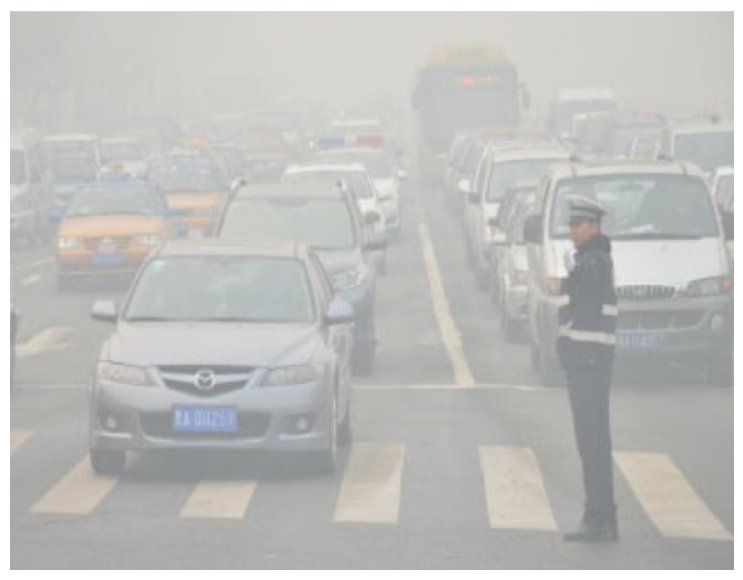

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0064036908881199535..1.3120276816608998].


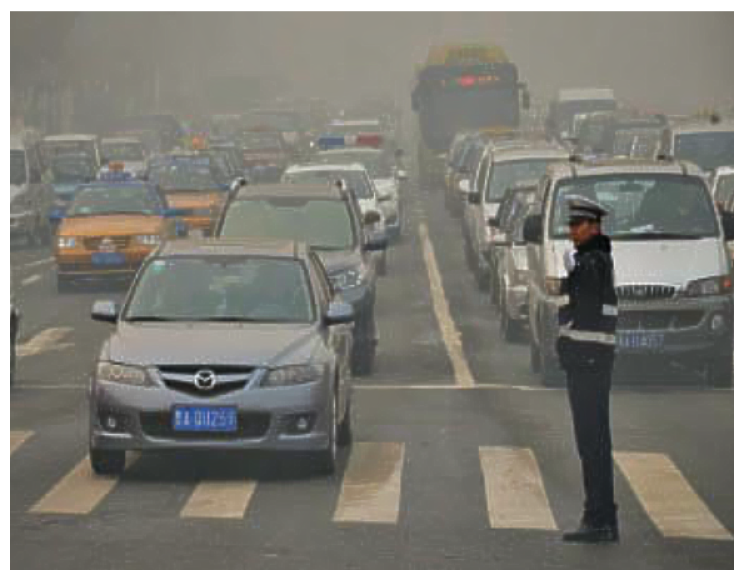

In [17]:
image_path = '../Capture.PNG'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))

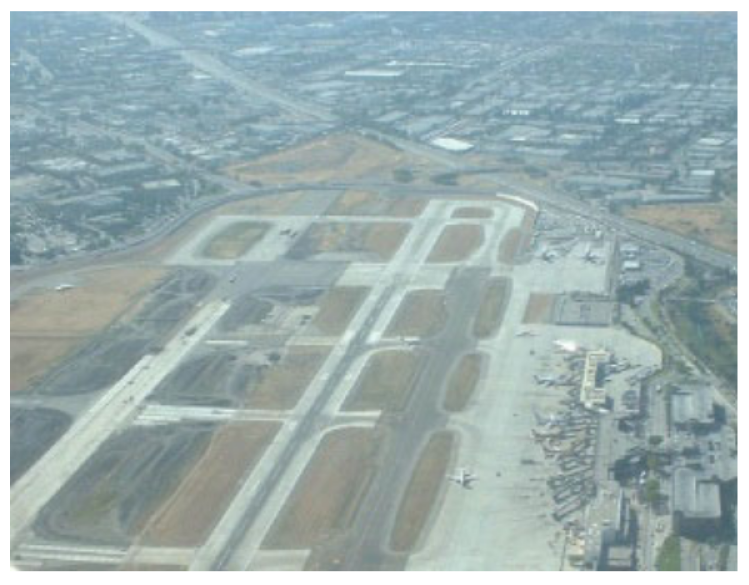

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.002758938869665513..1.2022698961937717].


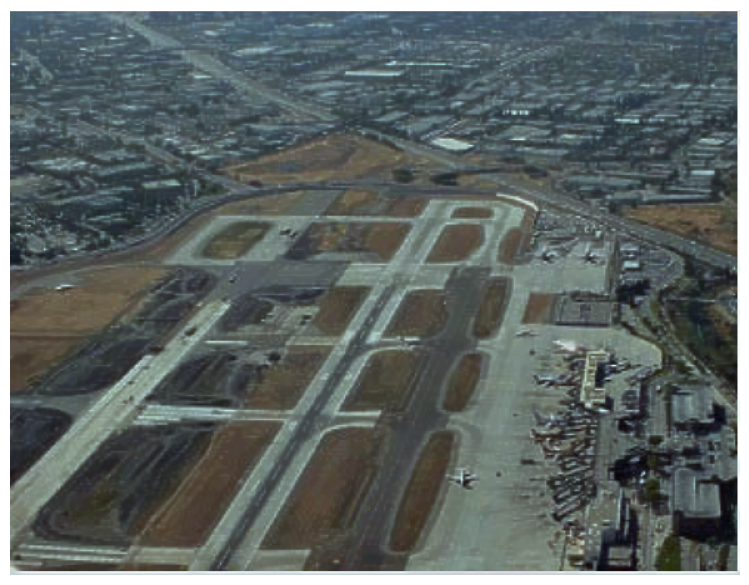

In [19]:
image_path = '../Capture1.PNG'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))

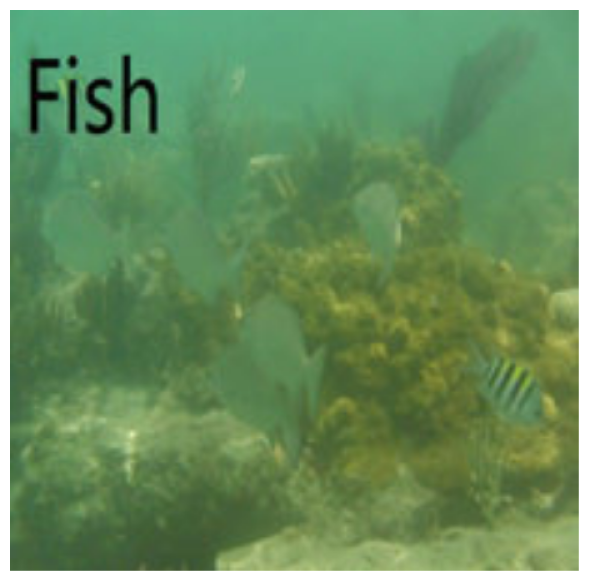

C:\Users\user\AppData\Local\Temp\ipykernel_2756\2137991744.py:11: RuntimeWarning: divide by zero encountered in log10
  SSR = np.log10(img) - np.log10(L)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.006228373702422145..1.3269859284890426].


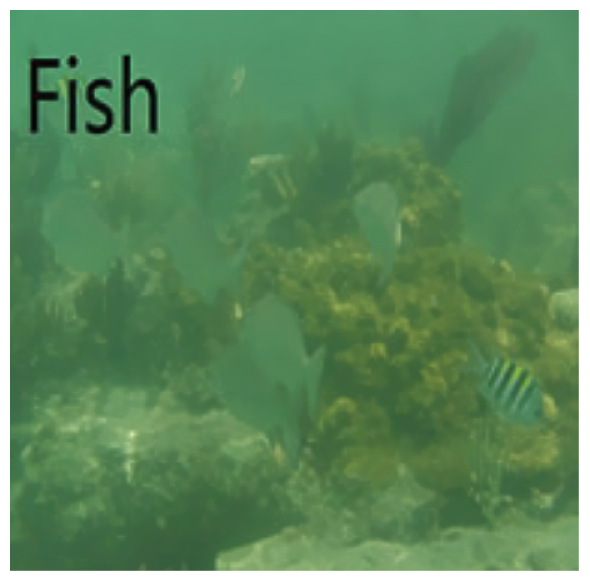

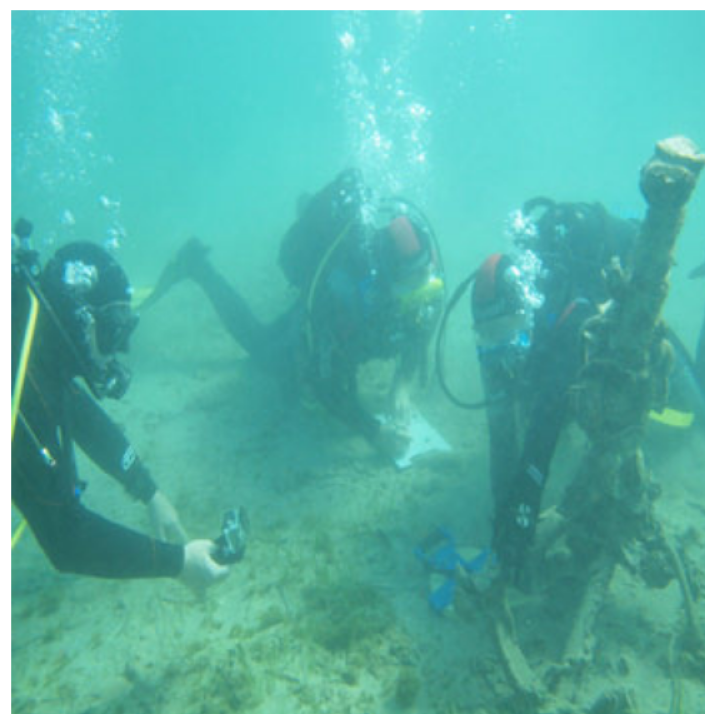

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.5199224913494809].


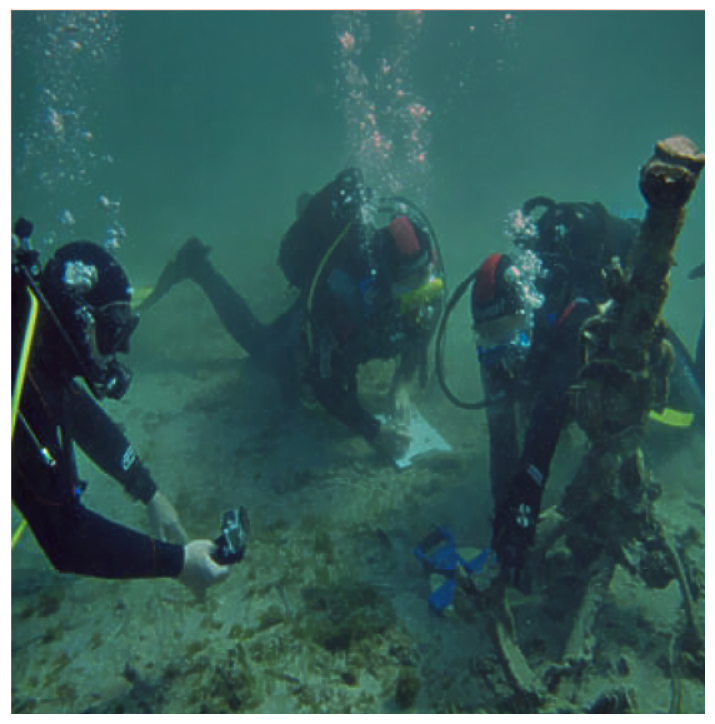

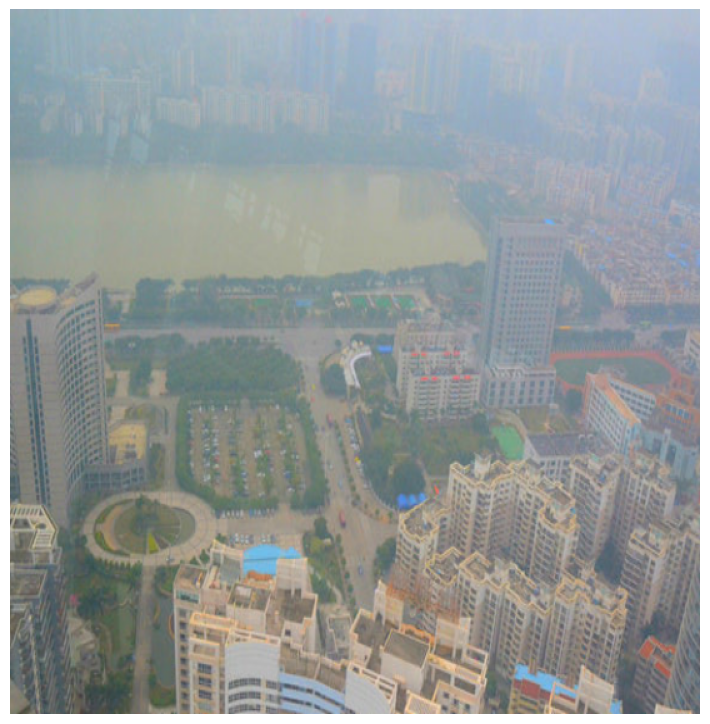

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.2377688581314878].


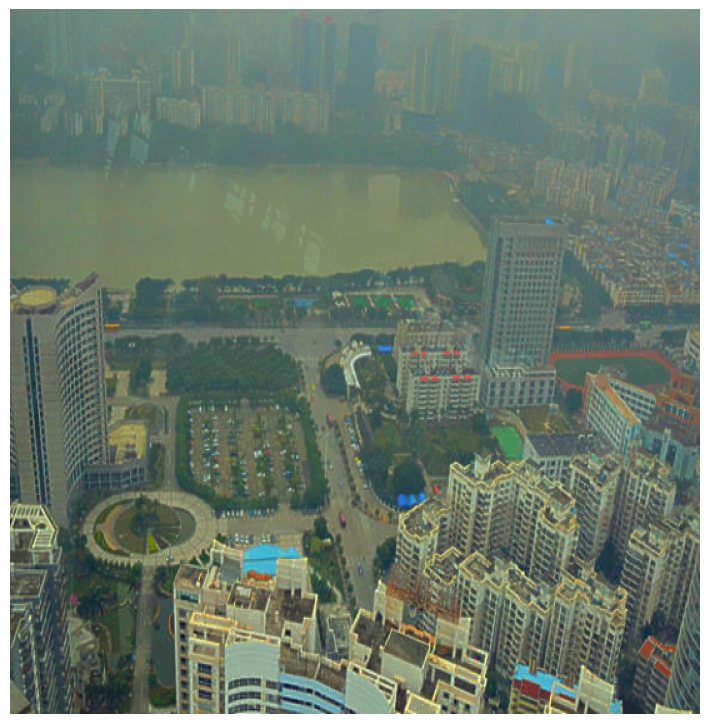

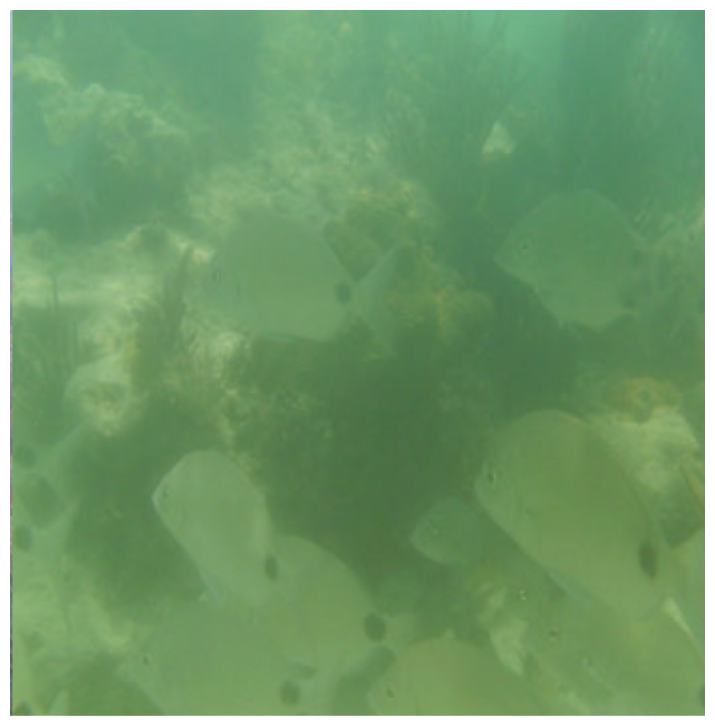

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0037831603229527104..1.583615224913495].


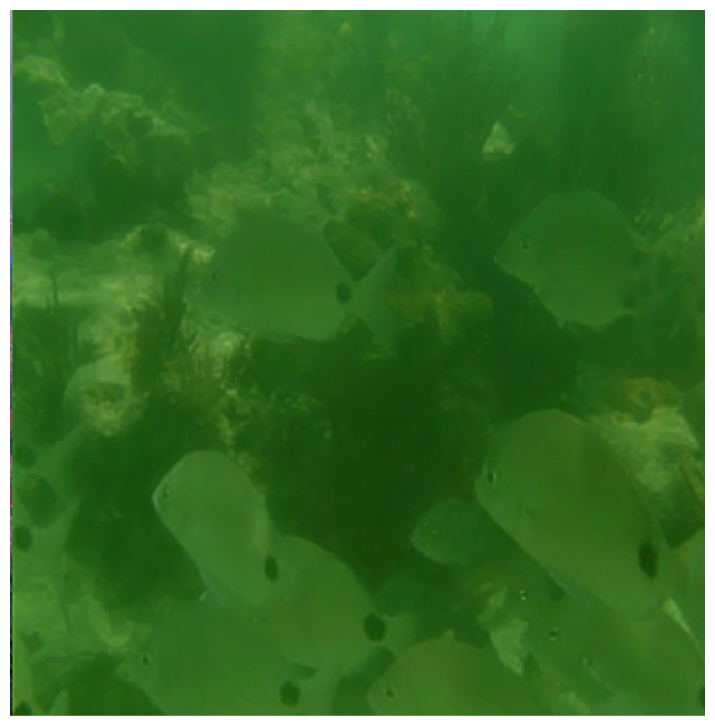

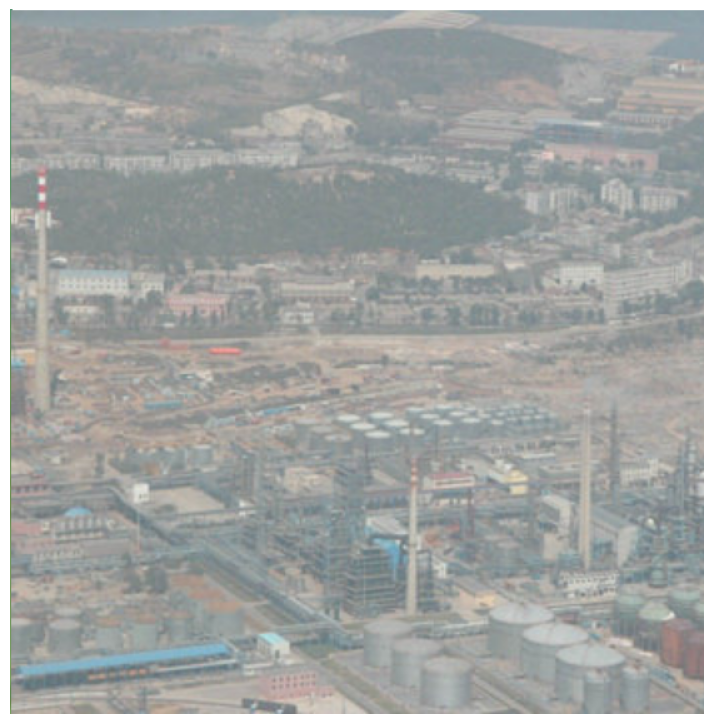

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.006422145328719723..1.4353568627450979].


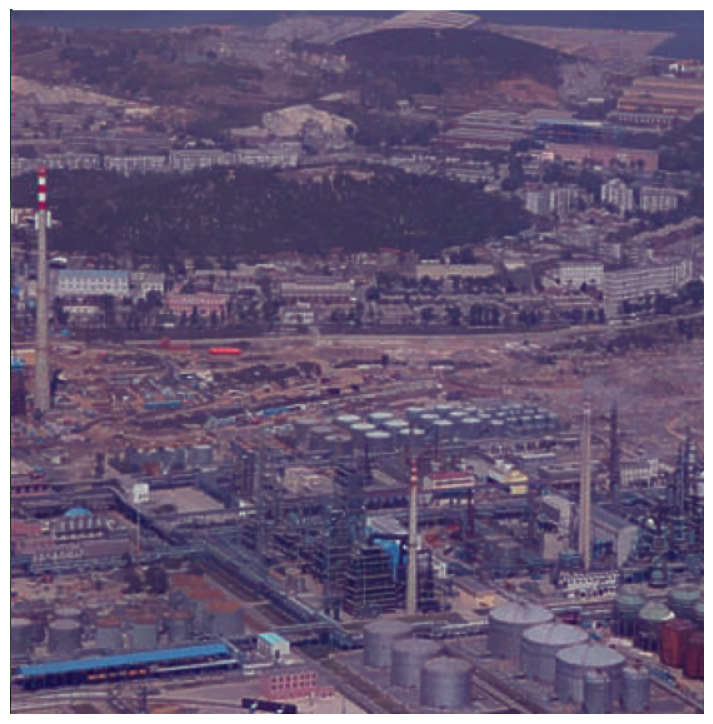

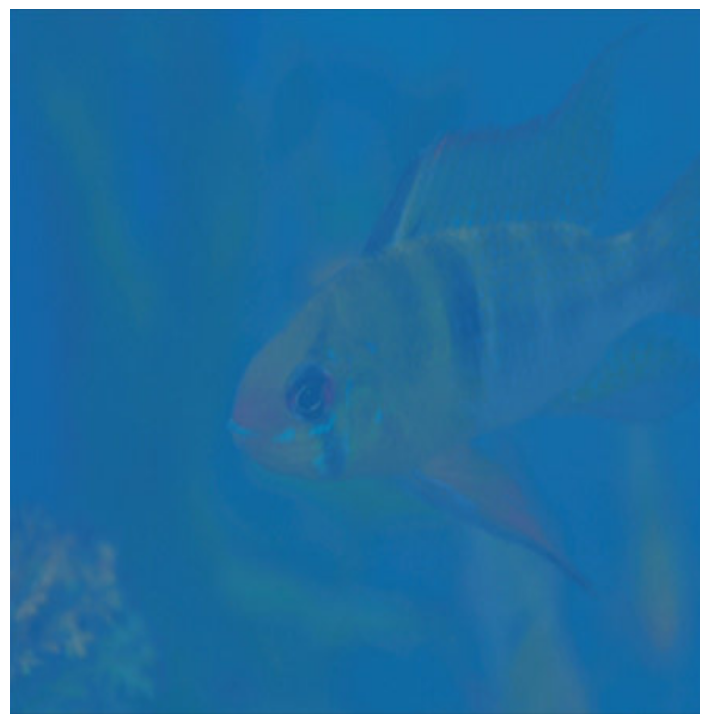

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0063760092272203..1.1954306805074972].


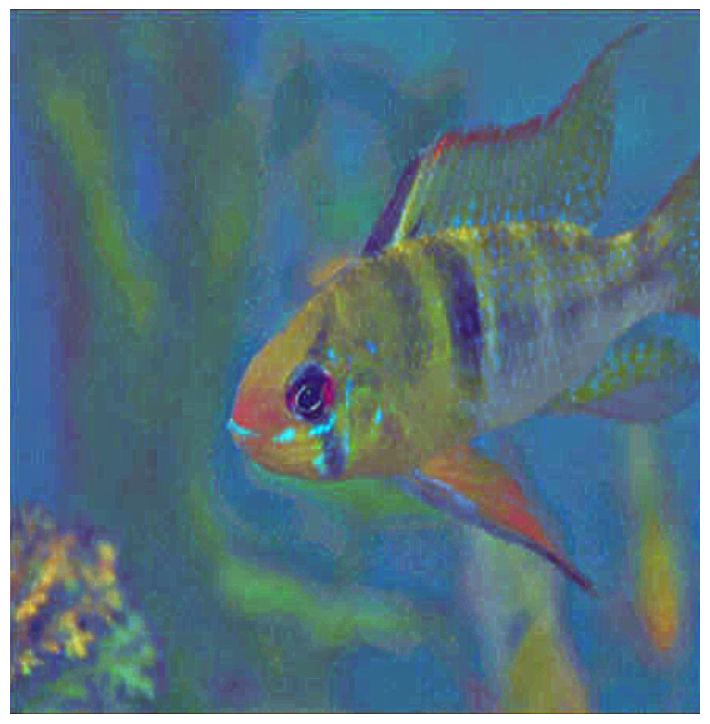

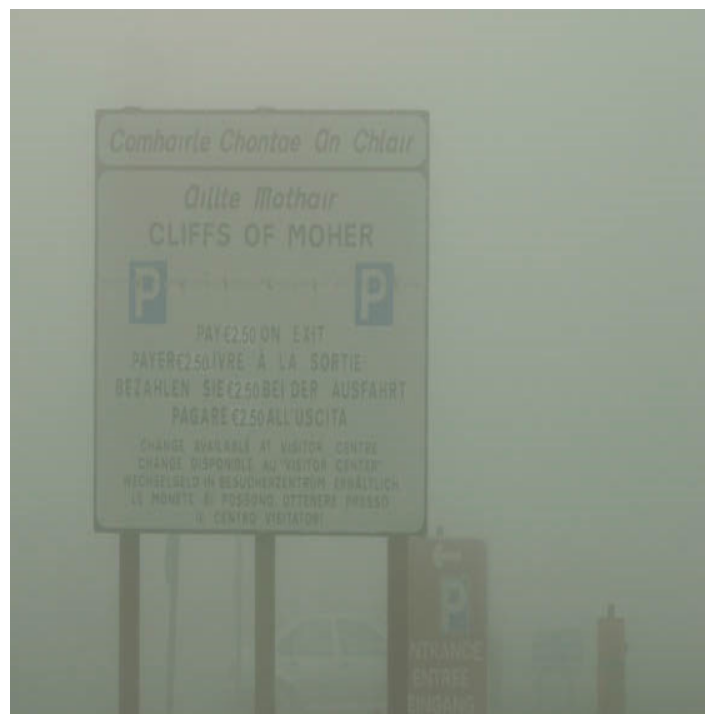

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.126315109573241].


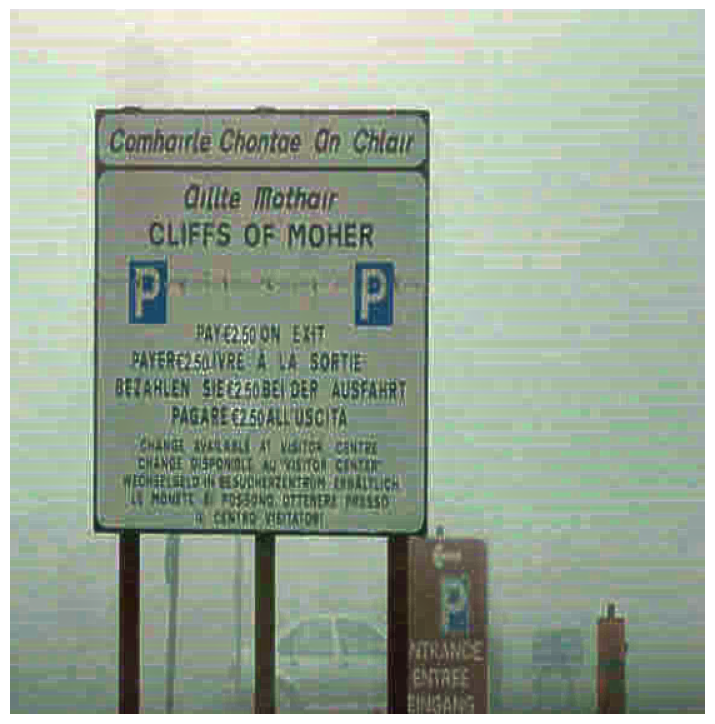

In [21]:

image_path = '../Capture3.PNG'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))


image_path = '../Capture4.PNG'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))


image_path = '../Capture5.PNG'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))


image_path = '../Capture6.PNG'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))


image_path = '../Capture7.PNG'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))


image_path = '../Capture8.PNG'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))



image_path = '../Capture9.PNG'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))

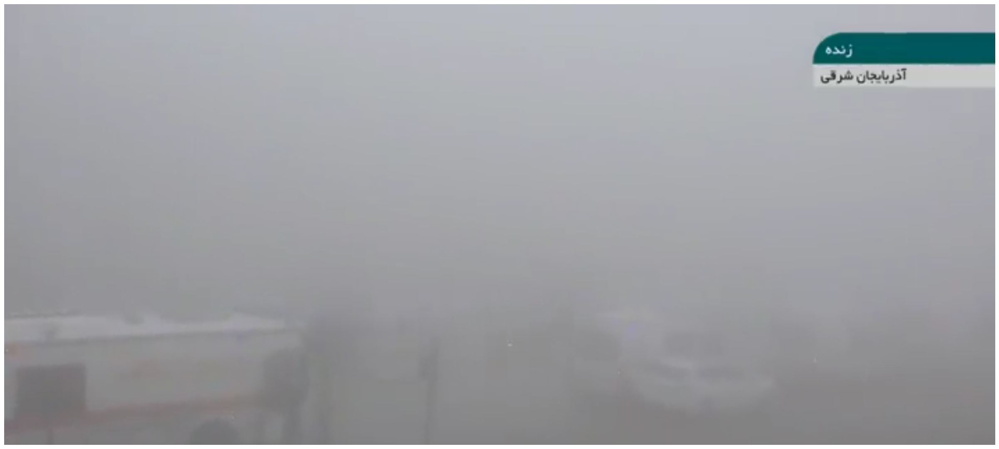

C:\Users\user\AppData\Local\Temp\ipykernel_2756\2137991744.py:11: RuntimeWarning: divide by zero encountered in log10
  SSR = np.log10(img) - np.log10(L)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1877231833910034].


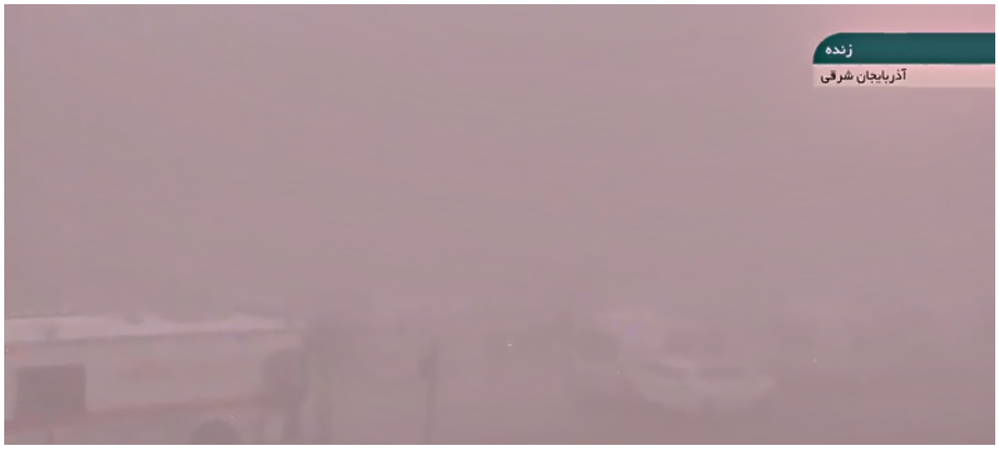

In [28]:
image_path = r'E:\ImageDefogging\retinex\Screenshot (2).png'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))

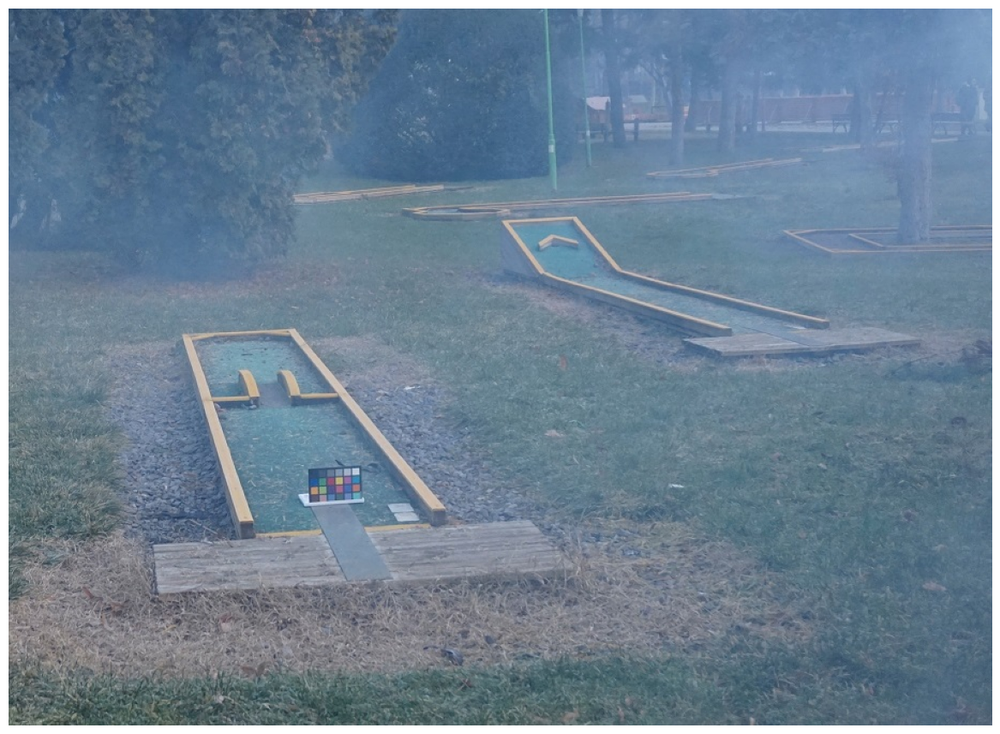

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.422961937716263].


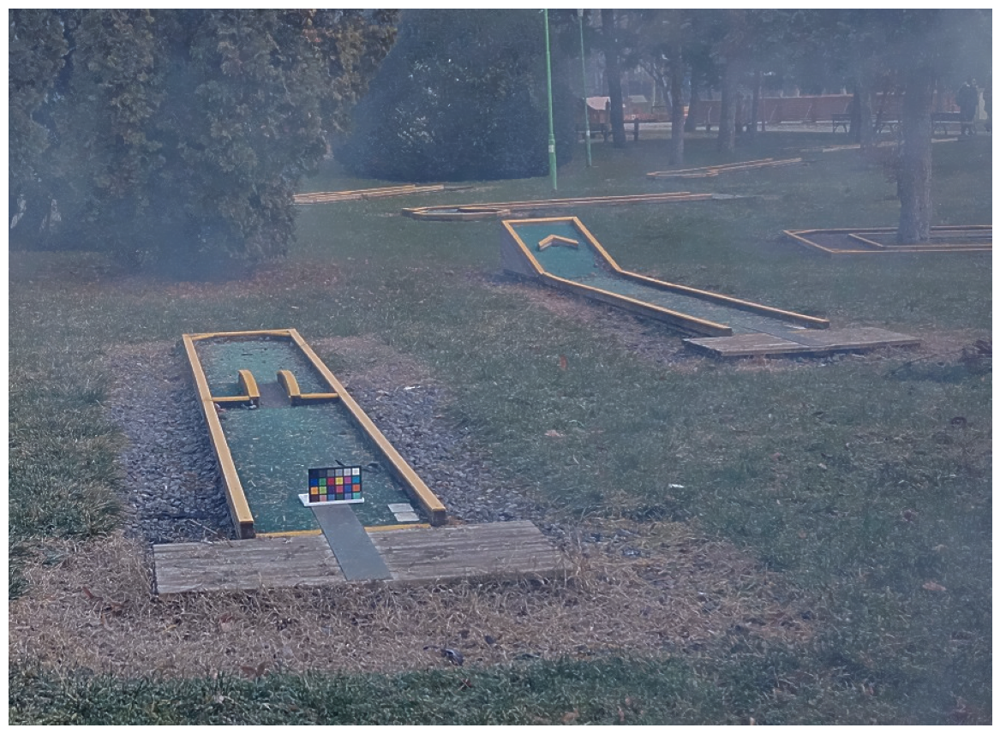

In [32]:
image_path = r'E:\ImageDefogging\examples\download (1).jfif'
display_image_in_actual_size(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))
display_image_in_actual_size(retinex_based_laplacian_pyramid_defogging(image_path))

In [165]:
import math
from skimage.util import img_as_ubyte

def AG(image):
  image = img_as_float64(image)
  if len(image.shape) == 3:
      # Normalize the image to the range [0, 1]
      image = (image - np.min(image)) / (np.max(image) - np.min(image))
      # Convert image to uint8 before using cv2.cvtColor
      image = img_as_ubyte(image)
      image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
      image = (image - np.min(image)) / (np.max(image) - np.min(image))
  else:
      # Normalize the image to the range [0, 1]
      image = (image - np.min(image)) / (np.max(image) - np.min(image))

  M = image.shape[0]
  N = image.shape[1]

  total = 0
  for i in range( 1,M-1):
    for j in range(1,N-1):
      tmp1 = (image[i+1,j] - image[i,j])**2
      tmp2 = (image[i,j+1] - image[i,j])**2

      tmp3 = tmp1 + tmp2

      total += math.sqrt(tmp3 / 2)

  return total/((M-1) * (N-1))

In [174]:
from scipy.stats import entropy
def IE(image):
    """
    Compute the Information Entropy (IE) of an image.
    """
    image = img_as_float64(image)
    if len(image.shape) == 3:
        # Normalize the image to the range [0, 1]
        image = (image - np.min(image)) / (np.max(image) - np.min(image))
        # Convert image to uint8 before using cv2.cvtColor
        image = img_as_ubyte(image)
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        image = (image - np.min(image)) / (np.max(image) - np.min(image))
    else:
        # Normalize the image to the range [0, 1]
        image = (image - np.min(image)) / (np.max(image) - np.min(image))

    # Compute histogram of the image
    hist, _ = np.histogram(image, bins=256, range=(0, 256), density=True)

    # Compute entropy
    ie = entropy(hist, base=2)
    return ie

In [186]:
a = ['','1','3','4','5','6','7','8','9']
for x in a:
  image_path = f'../Capture{x}.PNG'
  print(f'../Capture{x}.PNG')
  print( AG(cv2.imread(image_path,0)))

  print( AG(retinex_based_laplacian_pyramid_defogging(image_path)))
  print()

/content/Capture.PNG
0.012408455263756809
0.011676221103940928

/content/Capture1.PNG
0.025685671232169804
0.025716674579556762

/content/Capture3.PNG
0.008346229330361039


<ipython-input-179-5b87ba38759b>:18: RuntimeWarning: divide by zero encountered in log10
  SSR = np.log10(img) - np.log10(L)


0.006649593796185936

/content/Capture4.PNG
0.01055087698600658
0.007839971018674114

/content/Capture5.PNG
0.025171415730522558
0.028524943298824195

/content/Capture6.PNG
0.005734919761413598
0.004042396408570458

/content/Capture7.PNG
0.023946602579916803
0.018980168067409382

/content/Capture8.PNG
0.012646007497042219
0.0140432774980918

/content/Capture9.PNG
0.010730465981336932
0.022965786407847764



In [187]:
a = ['','1','3','4','5','6','7','8','9']
for x in a:
  image_path = f'../Capture{x}.PNG'
  print(f'../Capture{x}.PNG')
  print( IE(cv2.imread(image_path,0)))

  print( IE(retinex_based_laplacian_pyramid_defogging(image_path)))
  print()

/content/Capture.PNG
0.022875979046570613
0.0007329049606171476

/content/Capture1.PNG
0.09532640180193461
0.00013981007619679253

/content/Capture3.PNG
0.040859101397703074


<ipython-input-179-5b87ba38759b>:18: RuntimeWarning: divide by zero encountered in log10
  SSR = np.log10(img) - np.log10(L)


0.0002559121812790193

/content/Capture4.PNG
0.03415199535105298
0.00011927383326524555

/content/Capture5.PNG
0.00017447002580860975
0.00012007121888201253

/content/Capture6.PNG
0.01876140283571865
6.262009070416071e-05

/content/Capture7.PNG
0.018702182911972835
6.293076496724075e-05

/content/Capture8.PNG
0.00037961184976006415
0.00012007121888201253

/content/Capture9.PNG
0.001372681810985882
6.282586217947822e-05

